In [1]:
import requests
import os
import zipfile

zip_url = "https://s3.amazonaws.com/content.udacity-data.com/nd089/Cat_Dog_data.zip"

# Local path to save the ZIP file
zip_path = './downloaded_file.zip'

# Directory to extract the ZIP file's contents
extract_path = './extracted_content'

# Step 1: Download the ZIP file
with requests.get(zip_url, stream=True) as response:
    if response.status_code == 200:
        with open(zip_path, 'wb') as zip_file:
            for chunk in response.iter_content(chunk_size=8192):
                zip_file.write(chunk)
        print(f'ZIP file downloaded to {zip_path}')
    else:
        print(f'Failed to download ZIP file. Status code: {response.status_code}')

# Step 2: Extract the ZIP file
if not os.path.exists(extract_path):
    os.makedirs(extract_path)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f'ZIP file extracted to {extract_path}')


ZIP file downloaded to ./downloaded_file.zip
ZIP file extracted to ./extracted_content


In [12]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
import time
import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models

In [13]:
data_dir = './extracted_content/Cat_Dog_data'

# TODO: Define transforms for the training data and testing data
train_transforms = train_transforms = transforms.Compose([
                                       transforms.Resize((224, 224)),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.5, 0.5, 0.5],
                                                            [0.5, 0.5, 0.5])])

test_transforms = train_transforms = transforms.Compose([
                                       transforms.Resize((224, 224)),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.5, 0.5, 0.5],
                                                            [0.5, 0.5, 0.5])])


# Pass transforms in here, then run the next cell to see how the transforms look
train_data = datasets.ImageFolder(data_dir + '/train', transform=train_transforms)
test_data = datasets.ImageFolder(data_dir + '/test', transform=test_transforms)

trainloader = torch.utils.data.DataLoader(train_data, batch_size=64, shuffle=True)
testloader = torch.utils.data.DataLoader(test_data, batch_size=64)

In [15]:
model = models.resnet50(pretrained=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

for param in model.parameters():
    param.requires_grad = False

classifier = nn.Sequential(nn.Linear(2048, 512),
                           nn.ReLU(),
                           nn.Dropout(p=0.2),
                           nn.Linear(512, 2),
                           nn.LogSoftmax(dim=1)
                          )
model.fc = classifier

criterion = nn.NLLLoss()
# Only train the classifier parameters, feature parameters are frozen
optimizer = optim.Adam(model.fc.parameters(), lr=0.003)

model = model.to(device)

cuda


In [17]:
epochs = 1
step = 0
print_every = 5
running_loss = 0

for epoch in range(epochs):
    for images, labels in trainloader:
        step += 1

        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        logps = model(images)

        loss = criterion(logps, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

        if step % print_every == 0:
            model.eval()
            test_loss = 0
            accuracy = 0

            with torch.no_grad():
                for inputs, labels in testloader:

                    inputs, labels = inputs.to(device), labels.to(device)

                    logps = model.forward(inputs)
                    batch_loss = criterion(logps, labels)

                    test_loss += batch_loss.item()

                    # Calculate Accuracy
                    ps = torch.exp(logps)
                    top_ps, top_class = ps.topk(1, dim=1)
                    equality = top_class == labels.view(*top_class.shape)
                    accuracy += torch.mean(equality.type(torch.FloatTensor)).item()

            print(f"Epoch {epoch+1}/{epochs}.. "
                  f"Train loss: {running_loss/print_every:.3f}.. "
                  f"Test loss: {test_loss/len(testloader):.3f}.. "
                  f"Test accuracy: {accuracy/len(testloader):.3f}")
            running_loss = 0
            model.train()

Epoch 1/1.. Train loss: 0.024.. Test loss: 0.047.. Test accuracy: 0.980
Epoch 1/1.. Train loss: 0.082.. Test loss: 0.072.. Test accuracy: 0.974
Epoch 1/1.. Train loss: 0.031.. Test loss: 0.052.. Test accuracy: 0.982
Epoch 1/1.. Train loss: 0.047.. Test loss: 0.047.. Test accuracy: 0.983
Epoch 1/1.. Train loss: 0.031.. Test loss: 0.045.. Test accuracy: 0.982
Epoch 1/1.. Train loss: 0.047.. Test loss: 0.098.. Test accuracy: 0.963
Epoch 1/1.. Train loss: 0.066.. Test loss: 0.050.. Test accuracy: 0.983
Epoch 1/1.. Train loss: 0.081.. Test loss: 0.048.. Test accuracy: 0.981
Epoch 1/1.. Train loss: 0.064.. Test loss: 0.059.. Test accuracy: 0.978
Epoch 1/1.. Train loss: 0.095.. Test loss: 0.045.. Test accuracy: 0.982
Epoch 1/1.. Train loss: 0.049.. Test loss: 0.044.. Test accuracy: 0.984
Epoch 1/1.. Train loss: 0.049.. Test loss: 0.042.. Test accuracy: 0.983
Epoch 1/1.. Train loss: 0.072.. Test loss: 0.044.. Test accuracy: 0.985
Epoch 1/1.. Train loss: 0.062.. Test loss: 0.044.. Test accuracy

In [18]:
model.eval()
accuracy = 0
for images, labels in testloader:
    images, labels = images.to(device), labels.to(device)
    log_ps = model(images)
    ps = torch.exp(log_ps)
    top_p, top_class = ps.topk(1, dim=1)
    equals = top_class == labels.view(*top_class.shape)
    accuracy += torch.mean(equals.type(torch.FloatTensor))

print(f"Test accuracy: {accuracy/len(testloader):.3f}")

Test accuracy: 0.985


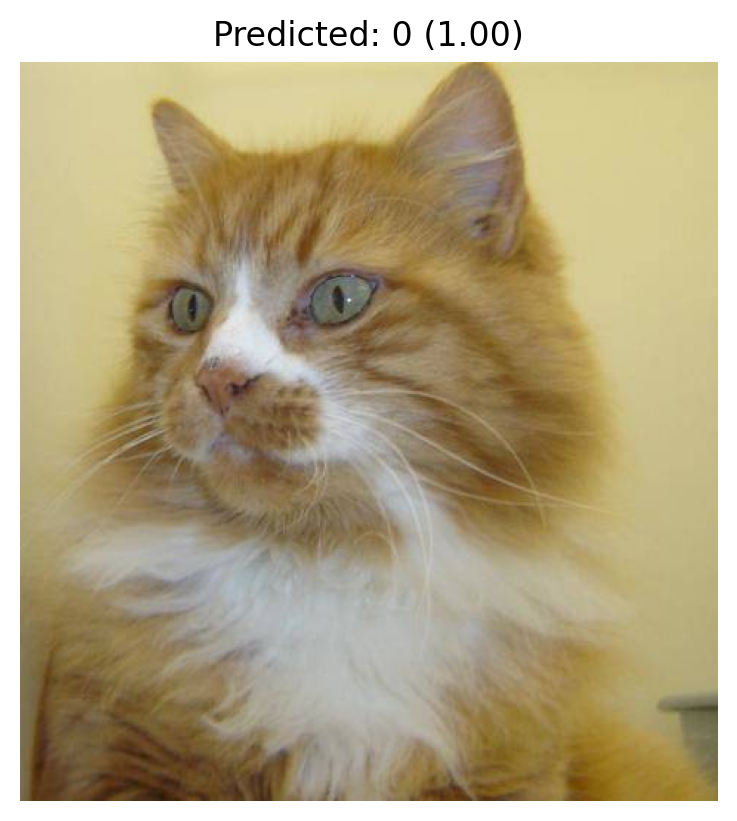

Probability distribution:
Class 1: 1.00
Class 2: 0.00


In [ ]:
import matplotlib.pyplot as plt
import PIL

# Define the image path
image_path = './extracted_content/Cat_Dog_data/test/cat/cat.10009.jpg'
# image_path = './extracted_content/Cat_Dog_data/test/dog/dog.10026.jpg'

# Load and preprocess the image
img = PIL.Image.open(image_path)
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])
img_tensor = transform(img).unsqueeze(0).to(device)

# Make a prediction
model.eval()
with torch.no_grad():
    log_ps = model(img_tensor)
    ps = torch.exp(log_ps)
    top_p, top_class = ps.topk(1, dim=1)

# Display the image and predicted probabilities
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {top_class[0].item():d} ({top_p[0].item():.2f})")  # Corrected format code
plt.show()

# Print the probability distribution among the two classes
print("Probability distribution:")
for i in range(len(ps[0])):
    print(f"Class {i+1}: {ps[0][i].item():.2f}")


In [19]:
torch.save({'model_state_dict': model.state_dict()}, 'checkpoint.pth')

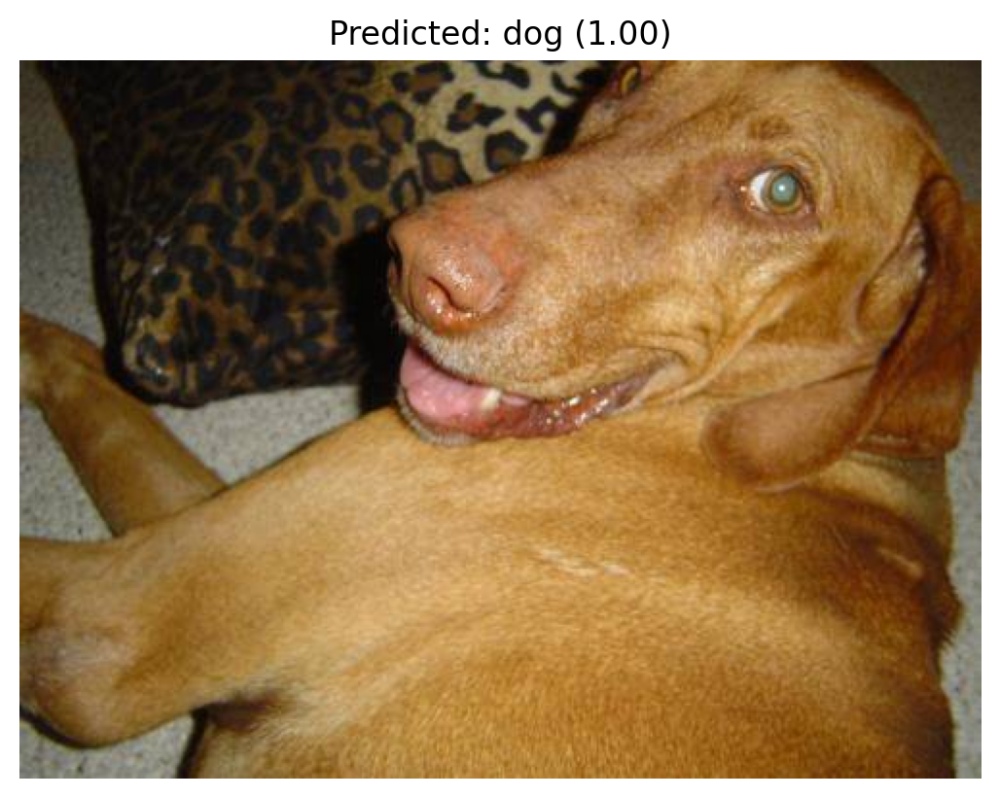

Probability distribution:
cat: 0.00
dog: 1.00
--------------------------------------------------


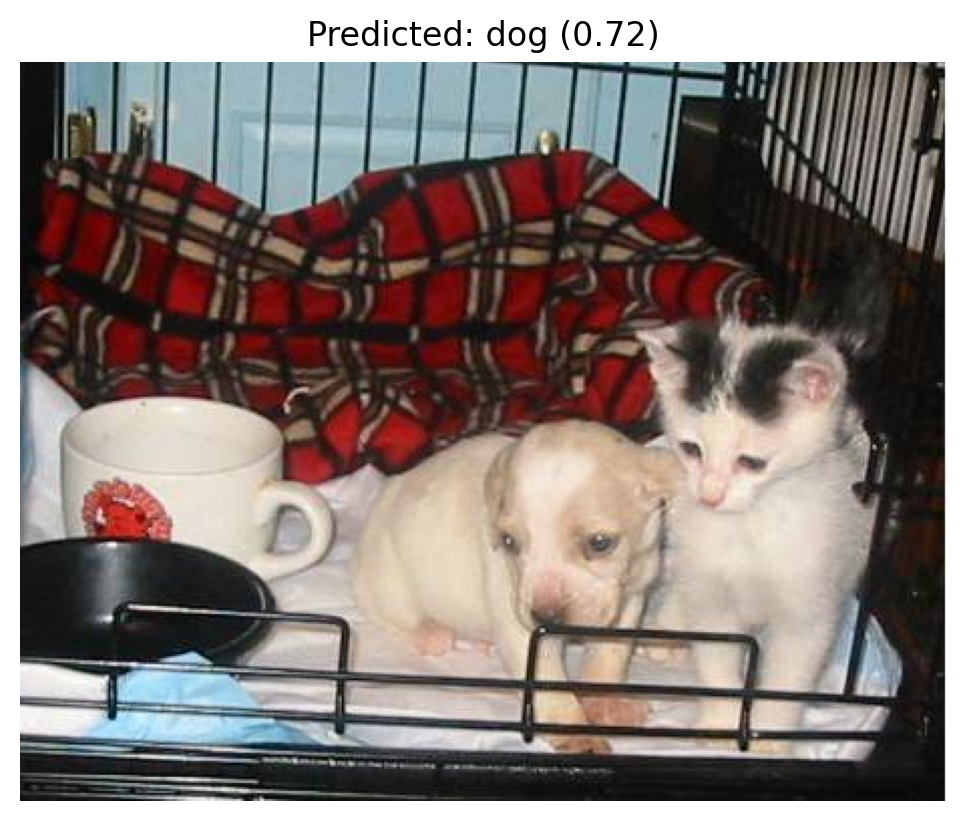

Probability distribution:
cat: 0.28
dog: 0.72
--------------------------------------------------


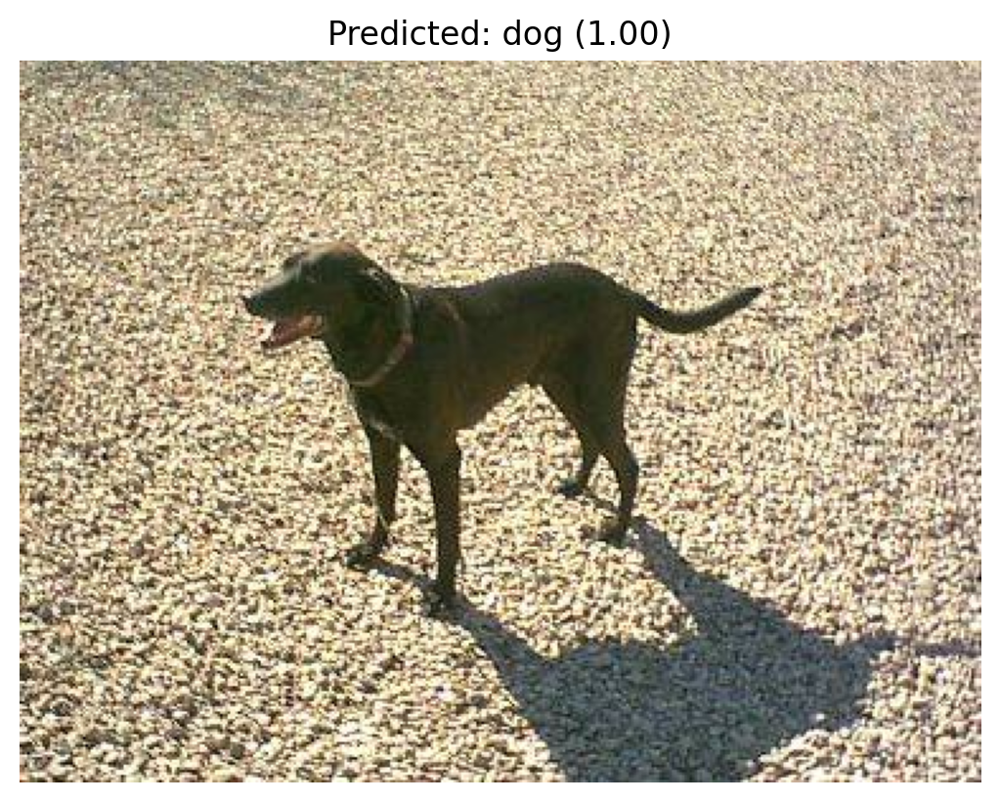

Probability distribution:
cat: 0.00
dog: 1.00
--------------------------------------------------


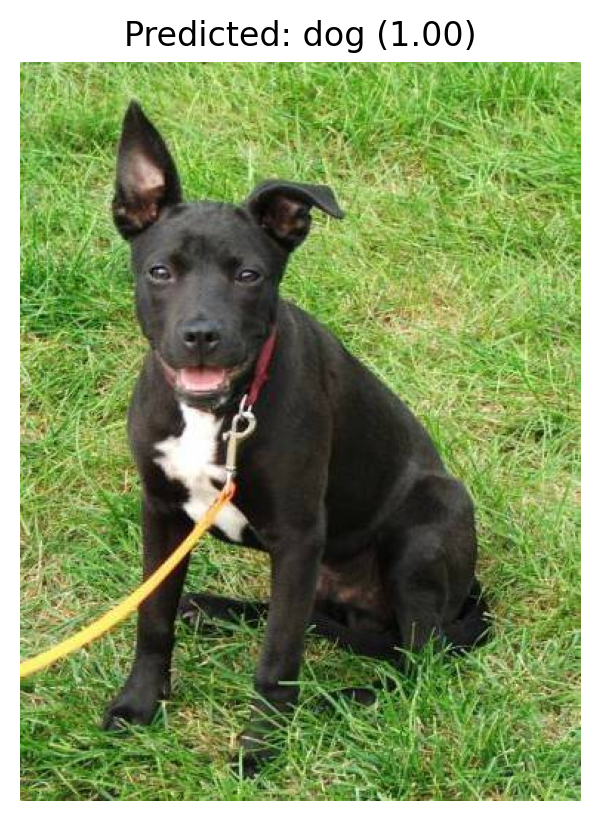

Probability distribution:
cat: 0.00
dog: 1.00
--------------------------------------------------


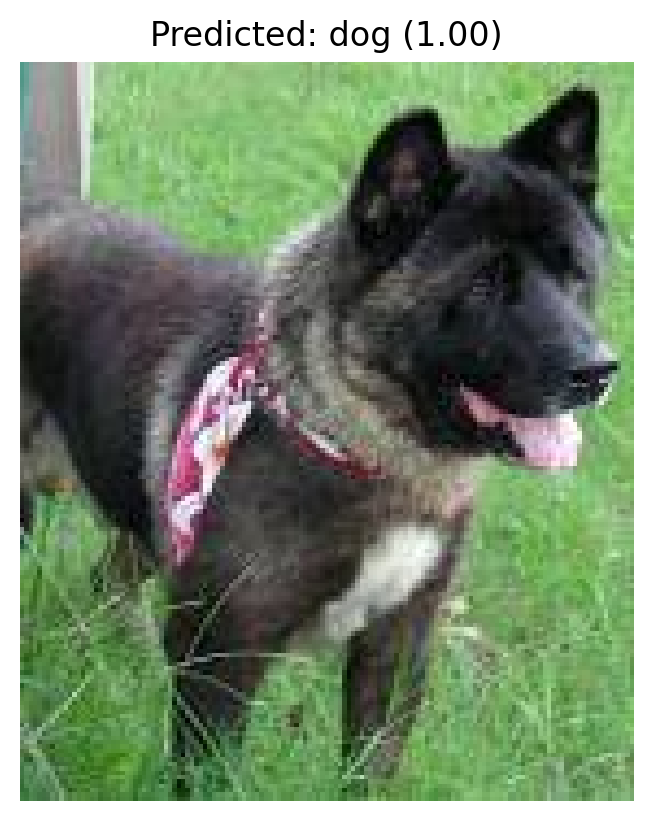

Probability distribution:
cat: 0.00
dog: 1.00
--------------------------------------------------


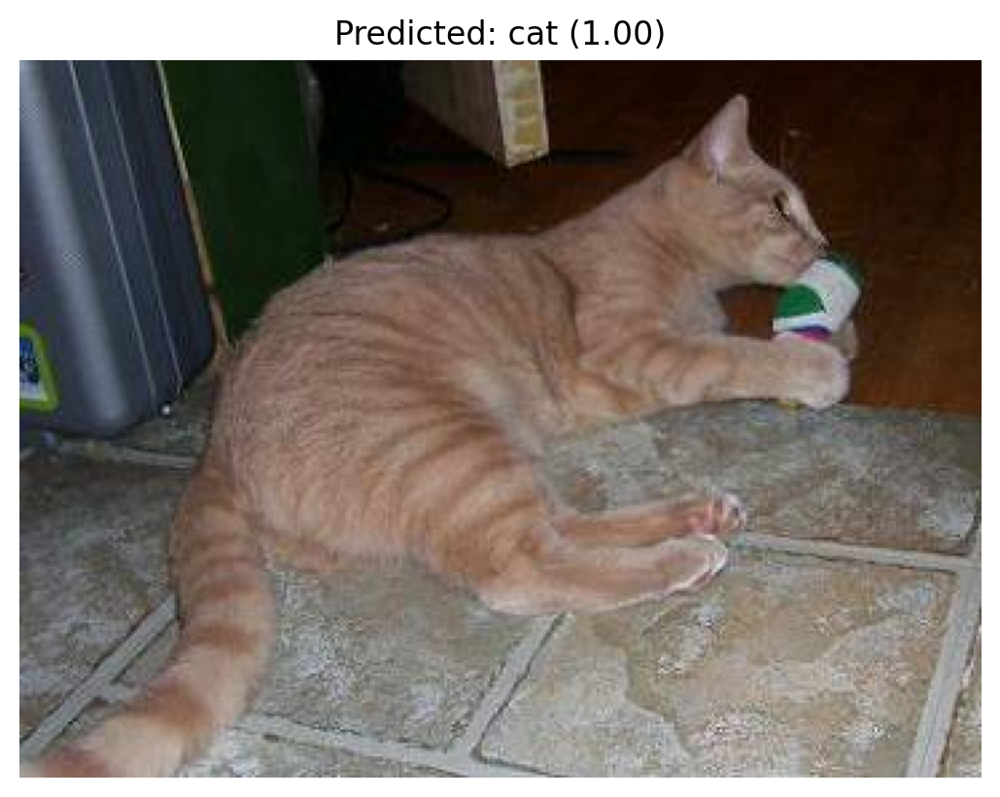

Probability distribution:
cat: 1.00
dog: 0.00
--------------------------------------------------


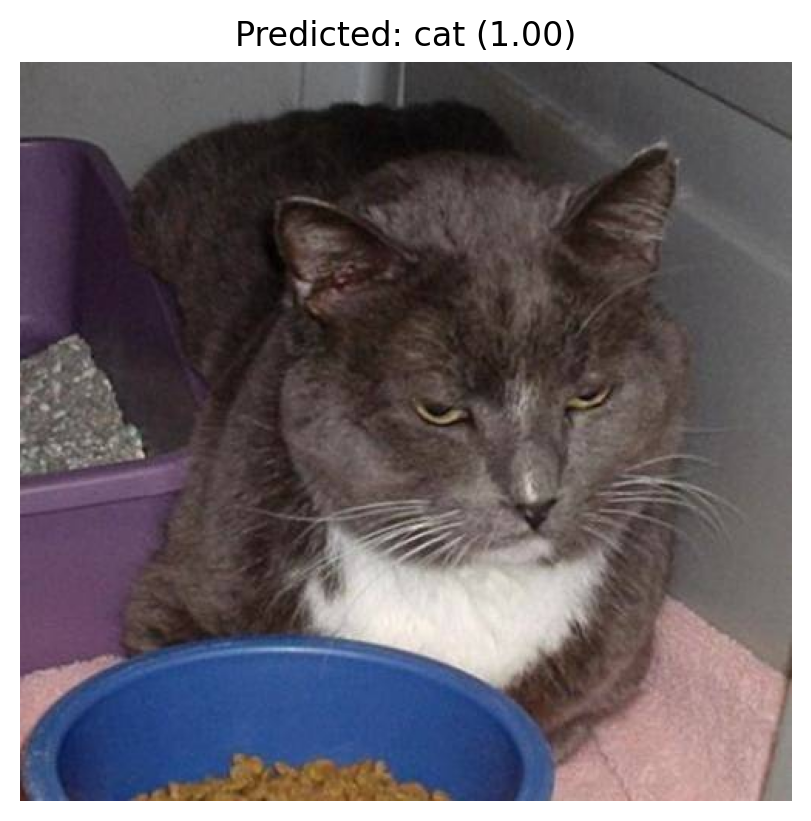

Probability distribution:
cat: 1.00
dog: 0.00
--------------------------------------------------


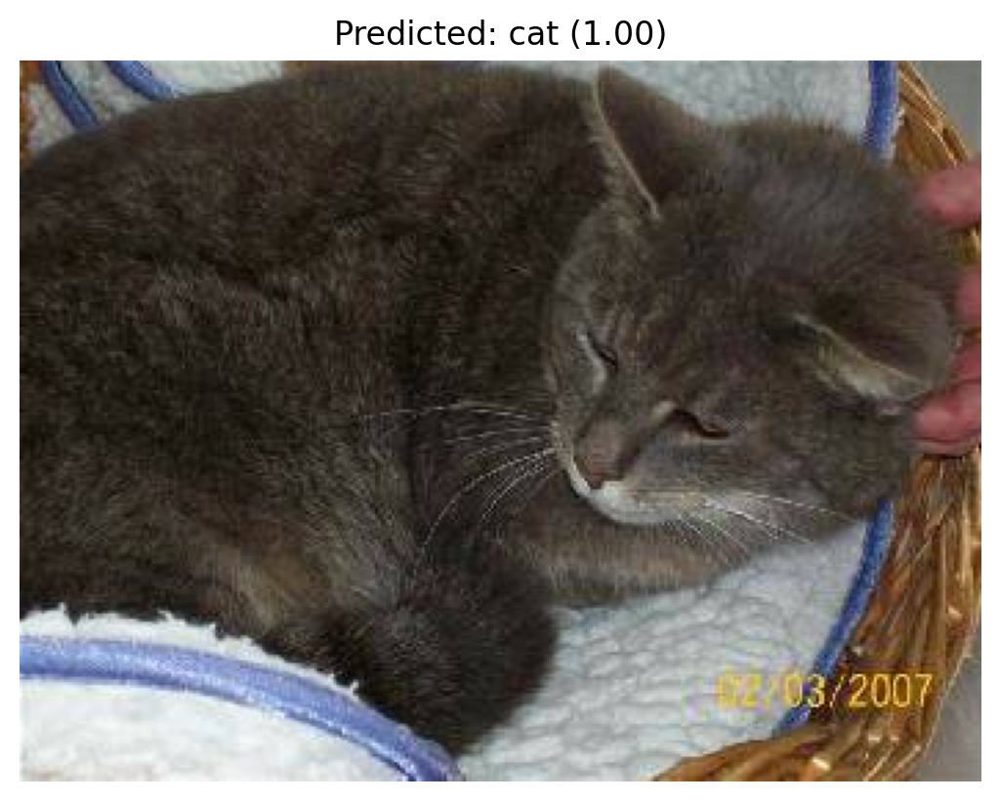

Probability distribution:
cat: 1.00
dog: 0.00
--------------------------------------------------


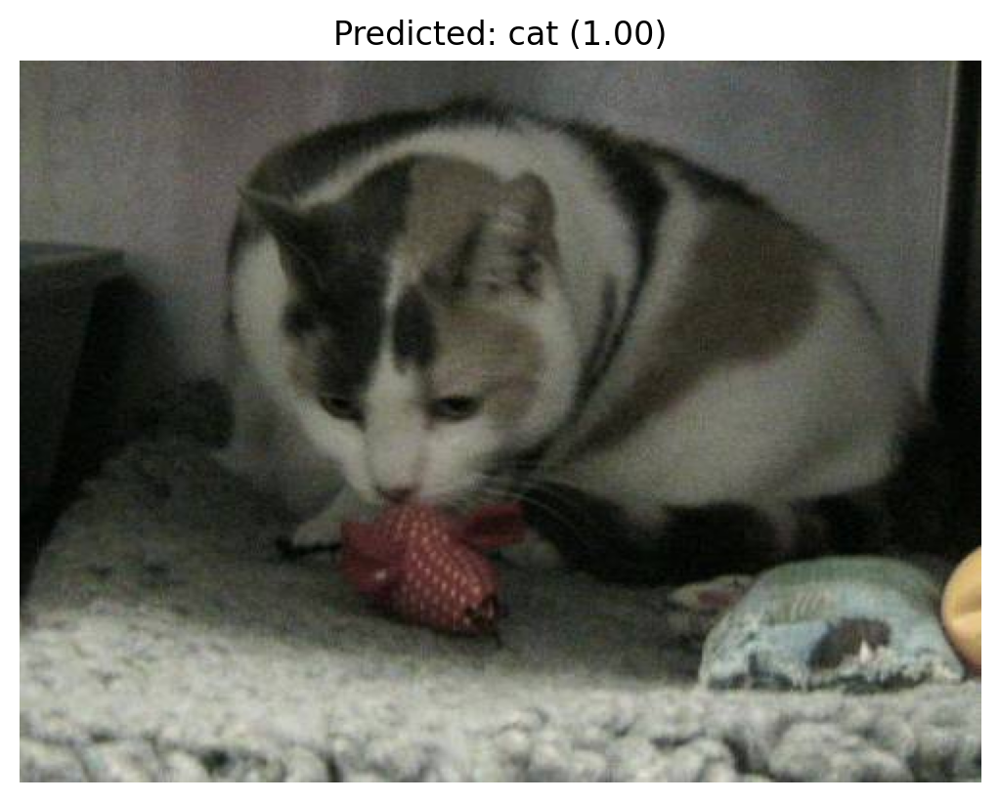

Probability distribution:
cat: 1.00
dog: 0.00
--------------------------------------------------


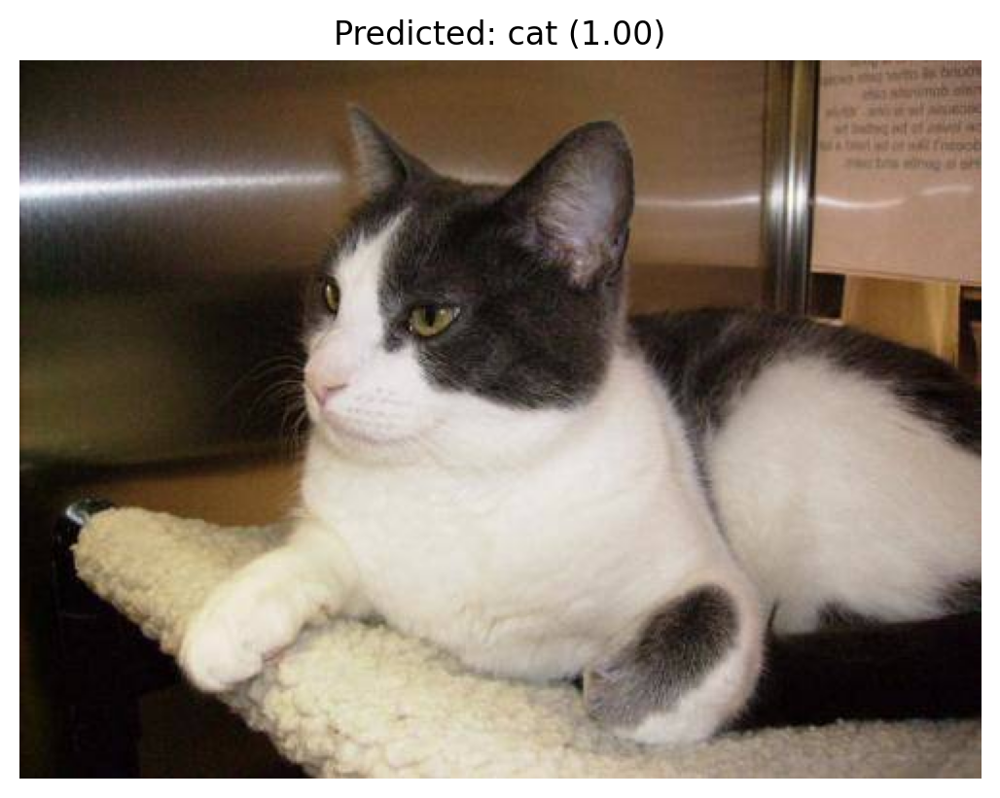

Probability distribution:
cat: 1.00
dog: 0.00
--------------------------------------------------


In [20]:
import torch
import PIL
import matplotlib.pyplot as plt

# Assuming you have defined `test_transforms` and `device` earlier

# Assuming you have a dictionary mapping class indices to their labels
class_labels = train_data.class_to_idx
class_labels = {value: key for key, value in class_labels.items()}

# Get 10 images of cats and dogs from the test dataset
dog_images = [img_path for img_path in os.listdir(data_dir + '/test/dog')[:5]]
cat_images = [img_path for img_path in os.listdir(data_dir + '/test/cat')[:5]]

for index, image_path in enumerate(dog_images + cat_images):
    if index >= 5:
      img = PIL.Image.open(os.path.join(data_dir + '/test/cat', image_path))
    else:
      img = PIL.Image.open(os.path.join(data_dir + '/test/dog', image_path))
    img_tensor = test_transforms(img).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        log_ps = model(img_tensor)
        ps = torch.exp(log_ps)
        top_p, top_class = ps.topk(1, dim=1)

    # Display the image
    plt.imshow(img)
    plt.axis('off')

    # Get the predicted class label and its probability
    predicted_class_index = top_class.item()
    predicted_class_label = class_labels.get(predicted_class_index)

    # Display the predicted class label and its probability
    plt.title(f"Predicted: {predicted_class_label} ({top_p.item():.2f})")
    plt.show()

    # Print the probability distribution among the two classes
    print("Probability distribution:")
    for i in range(len(ps[0])):
        print(f"{class_labels.get(i, 'Unknown')}: {ps[0][i].item():.2f}")

    print("-" * 50)  # Add a separator between images